<a href="https://colab.research.google.com/github/nurmuhimawann/otsu-tresholding/blob/main/image_bg_removal_test.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# library needed
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
%matplotlib inline

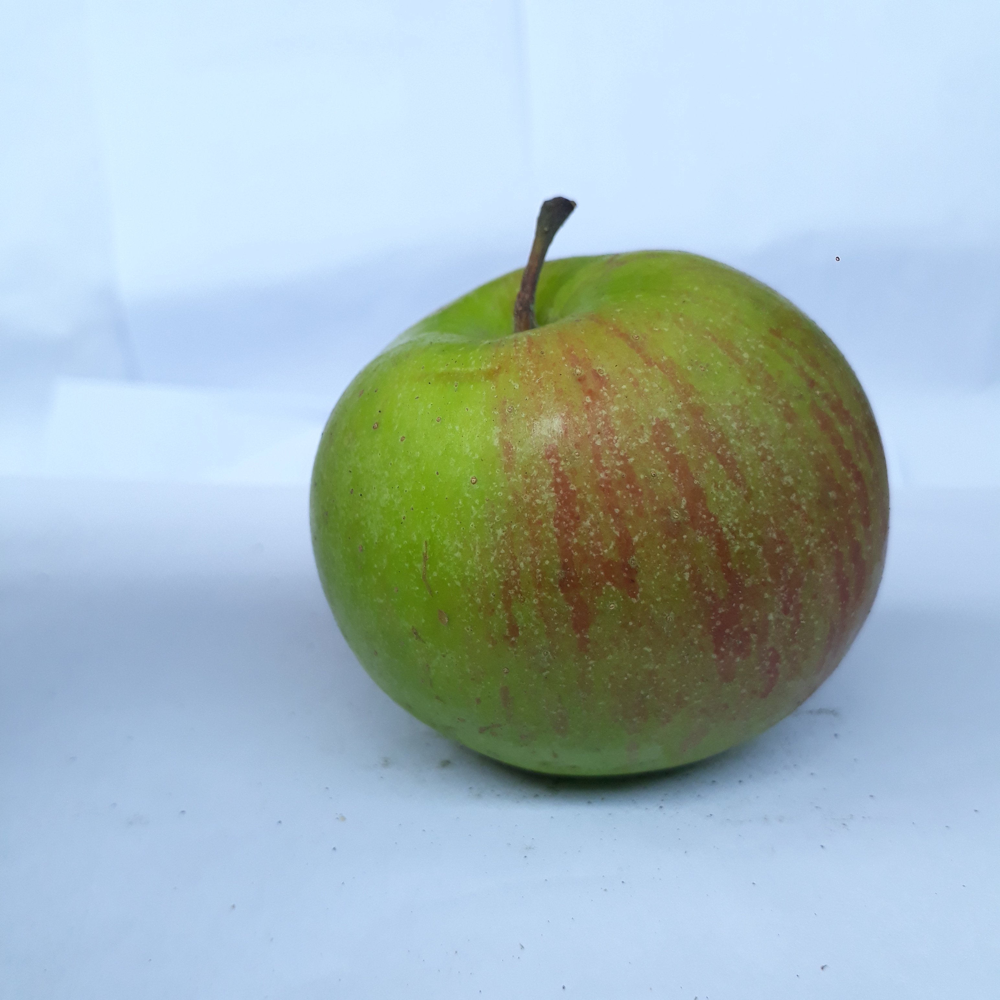

In [2]:
# apple image
apple_image = cv2.imread('input.jpg')
cv2_imshow(apple_image)

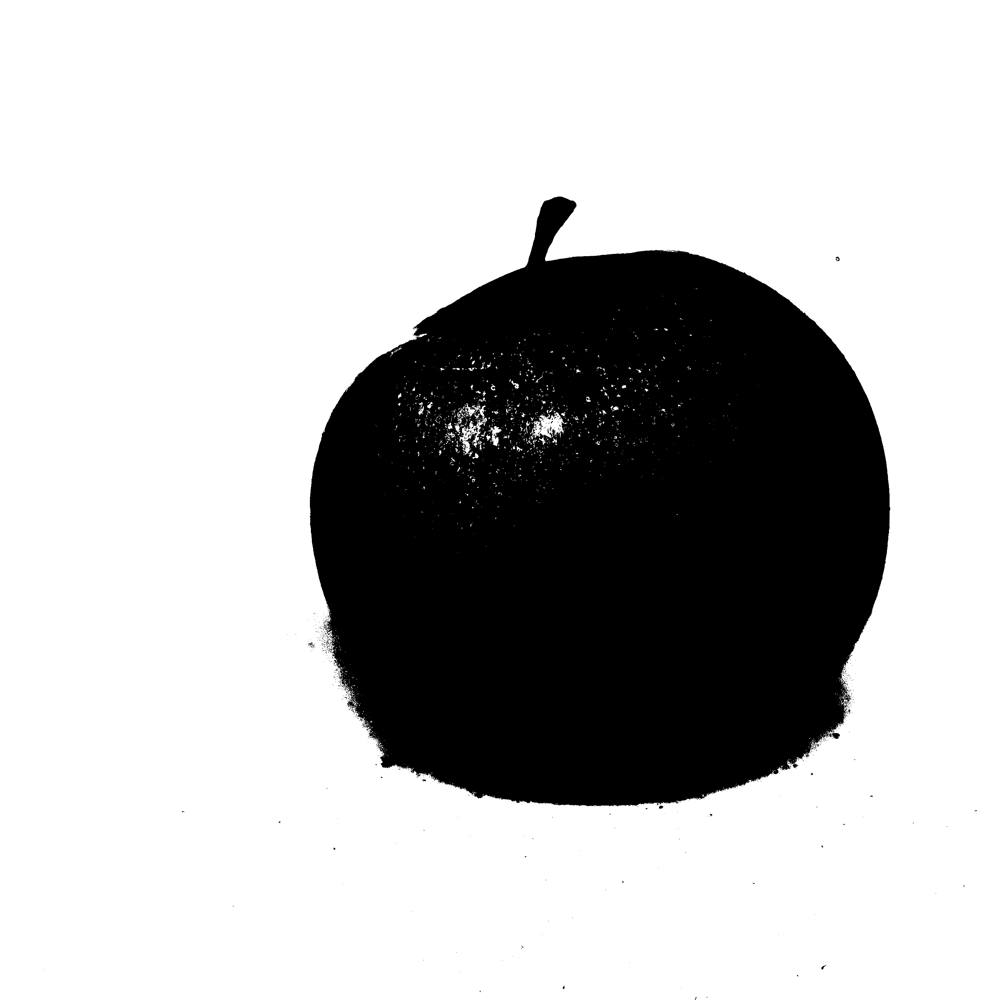

In [3]:
# Import the image in grayscale
img = cv2.imread('input.jpg', cv2.IMREAD_GRAYSCALE)

# Otsu's thresholding
ret, img_otsu_binary = cv2.threshold(img, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Plot the images
cv2_imshow(img_otsu_binary)

In [4]:
# assign to new variable
image_bin = img_otsu_binary

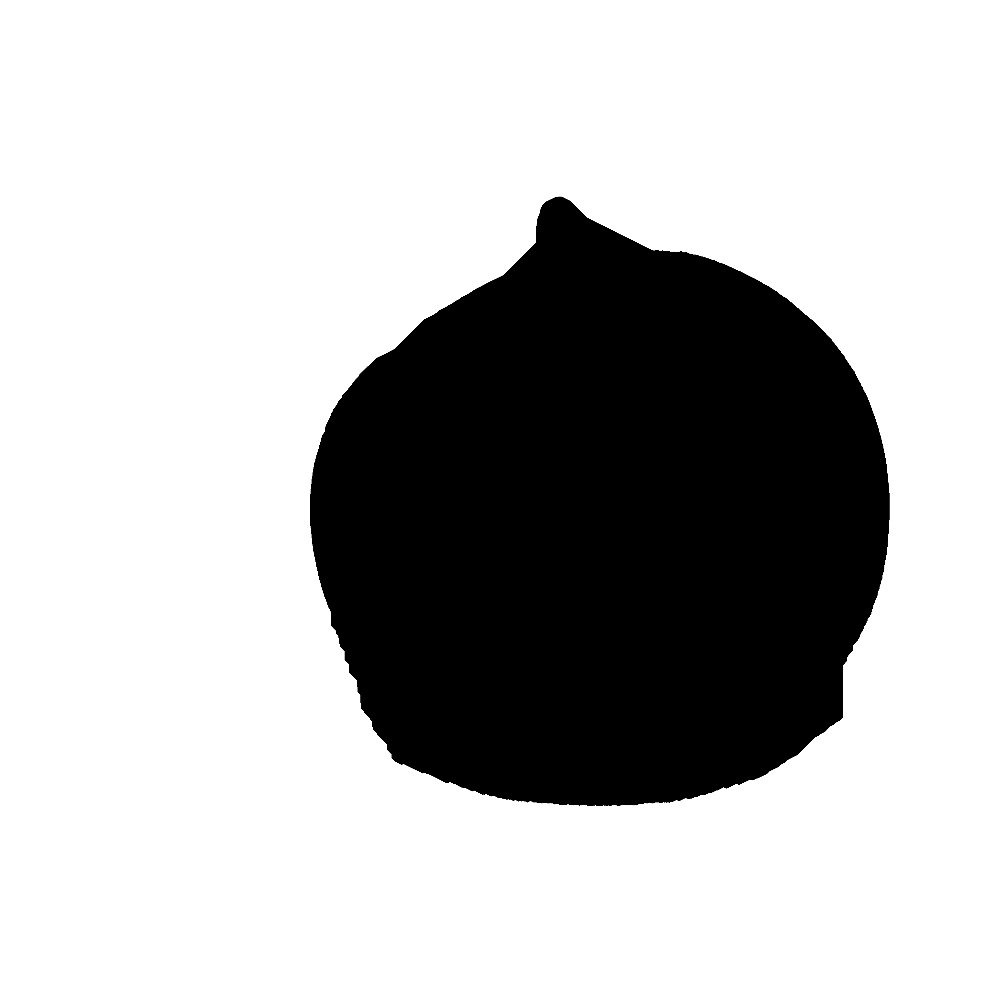

In [5]:
# denoise through morph ops
morph_kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (7, 7))
image_bin = cv2.morphologyEx(
    image_bin, cv2.MORPH_CLOSE, morph_kernel, iterations=10)  # remove black dots
image_bin = cv2.morphologyEx(
    image_bin, cv2.MORPH_OPEN, morph_kernel, iterations=100)  # fill inside

# Plot the images
cv2_imshow(image_bin)

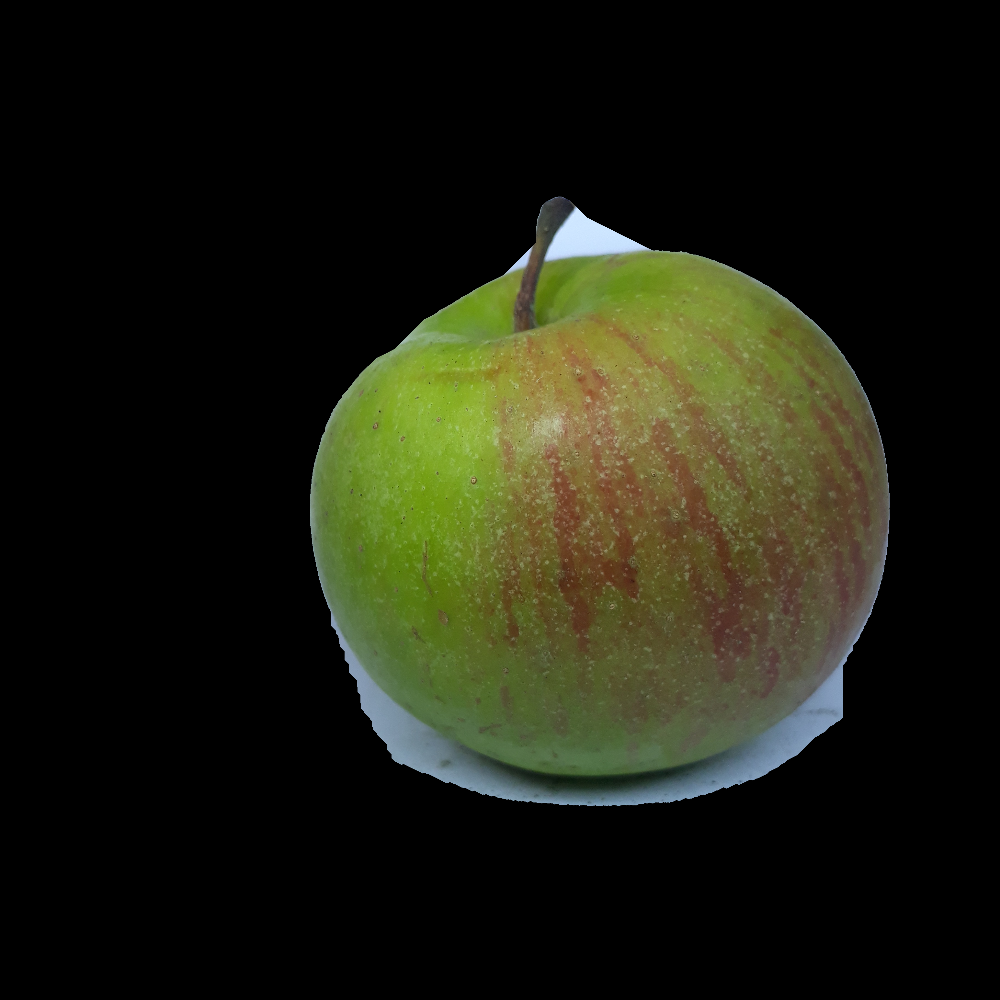

In [6]:
# Create a mask by inverting the binary image
mask = cv2.bitwise_not(image_bin)

# Extract the object color from the original image using the mask
object_color = cv2.bitwise_and(apple_image, apple_image, mask=mask)

# Show the result
cv2_imshow(object_color)

In [7]:
# Save the result
cv2.imwrite('output.jpg', object_color)

True